# **# Install Libraries**

In [49]:
# Core libraries
import os
import re
import json
import glob
import shutil
import random
from pathlib import Path
from collections import Counter

# Scientific computing
import numpy as np
import pandas as pd
import cv2
from PIL import Image, ImageDraw
import requests

# Plotting and visualization
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.patches import Patch

# PyTorch
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, Subset
from torchvision import transforms

# Deep learning models
import segmentation_models_pytorch as smp

# Geometry and spatial analysis
from scipy.ndimage import zoom
from scipy.spatial.distance import cdist
from numpy.polynomial.polynomial import polyvander2d, polyval2d

# Image processing (skimage)
from skimage.filters import threshold_otsu
from skimage.morphology import binary_opening, rectangle, remove_small_objects
from skimage.measure import label, regionprops

# Progress bar
from tqdm import tqdm


   # **# preparing data loaders in pytorch tensors**

In [184]:
def extract_year_from_image_id(image_id):
    try:
        return int(image_id.split('-')[1][:4])
    except Exception as e:
        raise ValueError(f"Failed to extract year from image ID '{image_id}': {e}")

def split_dataset_by_year(dataset, train_years, val_years, test_years):
    train_indices, val_indices, test_indices = [], [], []
    for idx, image_id in enumerate(dataset.image_ids):
        year = extract_year_from_image_id(image_id)
        if year in train_years:
            train_indices.append(idx)
        elif year in val_years:
            val_indices.append(idx)
        elif year in test_years:
            test_indices.append(idx)
    return train_indices, val_indices, test_indices

In [185]:
class ImageMaskTransform:
    def __init__(self, image_size=(512, 512)):
        self.image_transform = transforms.Compose([
            transforms.Resize(image_size),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.5], std=[0.5])  # Normalize image to [-1,1]
        ])
        self.mask_transform = transforms.ToTensor()

    def __call__(self, image, mask):
        image = self.image_transform(image)
        mask = self.mask_transform(mask)
        return image, mask

class FilamentDataset(Dataset):
    def __init__(self, image_dir, mask_dir, transform=None):
        self.image_index = self.index_images_by_id(image_dir)
        self.mask_dir = mask_dir
        self.image_ids = sorted(self.image_index.keys())
        self.transform = transform

    def __len__(self):
        return len(self.image_ids)

    def __getitem__(self, idx):
        image_id = self.image_ids[idx]
        img_path = self.image_index[image_id]
        mask_path = os.path.join(self.mask_dir, f"{image_id}.png")
        image = Image.open(img_path).convert("L")
        mask = Image.open(mask_path).convert("L")
        if self.transform:
            image, mask = self.transform(image, mask)
        mask = (mask > 0).float()  # binarize mask
        return image, mask, image_id

    @staticmethod
    def index_images_by_id(image_dir, extensions=(".jpg", ".jpeg", ".png", ".tif")):
        image_index = {}
        for root, _, files in os.walk(image_dir):
            for file in files:
                if file.lower().endswith(extensions):
                    image_id = os.path.splitext(file)[0]
                    image_index[image_id] = os.path.join(root, file)
        return image_index


In [187]:
image_dir = "processed-halpha-directory"
mask_dir = "halphs-labels"

full_dataset = FilamentDataset(image_dir=image_dir, mask_dir=mask_dir, transform=None)
train_years = {2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018}
val_years = {2019, 2020}
test_years = {2021, 2022}
train_idx, val_idx, test_idx = split_dataset_by_year(full_dataset, train_years, val_years, test_years)

# --- Toggle for quick prototyping ---
use_small_subset = False  # Set to False for full dataset

if use_small_subset:
    RANDOM_SEED = 42
    random.seed(RANDOM_SEED)
    train_idx = random.sample(train_idx, min(200, len(train_idx)))
    val_idx = random.sample(val_idx, min(50, len(val_idx)))
    test_idx = random.sample(test_idx, min(50, len(test_idx)))

shared_transform = ImageMaskTransform(image_size=(512, 512))

In [188]:
train_dataset = Subset(FilamentDataset(image_dir, mask_dir, transform=shared_transform), train_idx)
val_dataset = Subset(FilamentDataset(image_dir, mask_dir, transform=shared_transform), val_idx)
test_dataset = Subset(FilamentDataset(image_dir, mask_dir, transform=shared_transform), test_idx)

train_loader = DataLoader(train_dataset, batch_size=2, shuffle=True, num_workers=4, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=2, shuffle=False, num_workers=2)
test_loader = DataLoader(test_dataset, batch_size=2, shuffle=False, num_workers=2)

In [189]:
print(f"Total training samples: {len(train_dataset)}")
print(f"Total validation samples: {len(val_dataset)}")
print(f"Total test samples: {len(test_dataset)}")


Total training samples: 1295
Total validation samples: 45
Total test samples: 99


In [192]:
# Inspect a batch
images, masks, ids = next(iter(train_loader))
print(images.shape) 
print(masks.shape)  

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
images = images.to(device, non_blocking=True)
masks = masks.to(device, non_blocking=True)

torch.Size([2, 1, 512, 512])
torch.Size([2, 1, 512, 512])


   # **# EdgeAttNet Model & Training**

Epoch 1/50 - Train Loss: 1.8116, IoU: 0.0235 | Val Loss: 1.7989, IoU: 0.0057


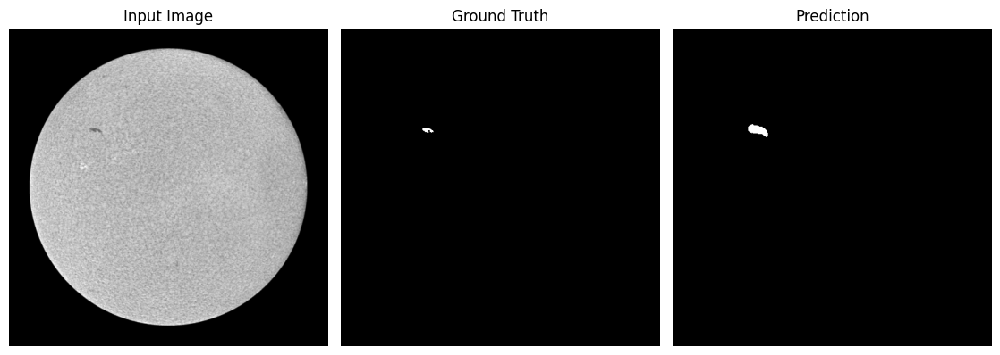

Epoch 2/50 - Train Loss: 1.6302, IoU: 0.0814 | Val Loss: 1.7310, IoU: 0.0169


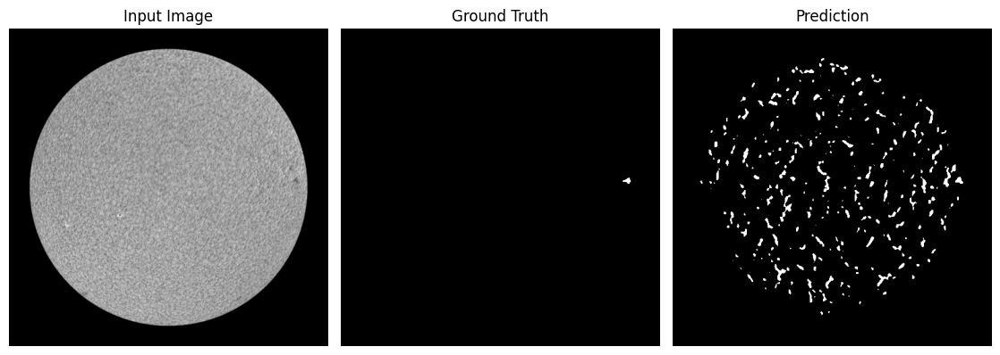

Epoch 3/50 - Train Loss: 1.3500, IoU: 0.2556 | Val Loss: 1.5533, IoU: 0.1102


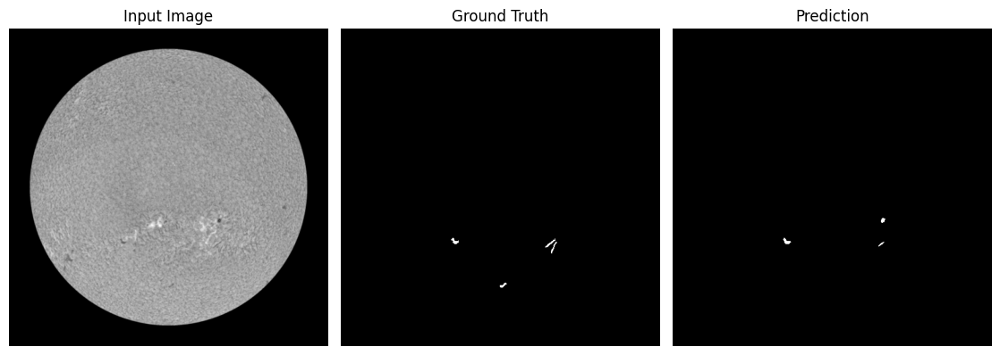

Epoch 4/50 - Train Loss: 1.1635, IoU: 0.4075 | Val Loss: 1.3300, IoU: 0.2681


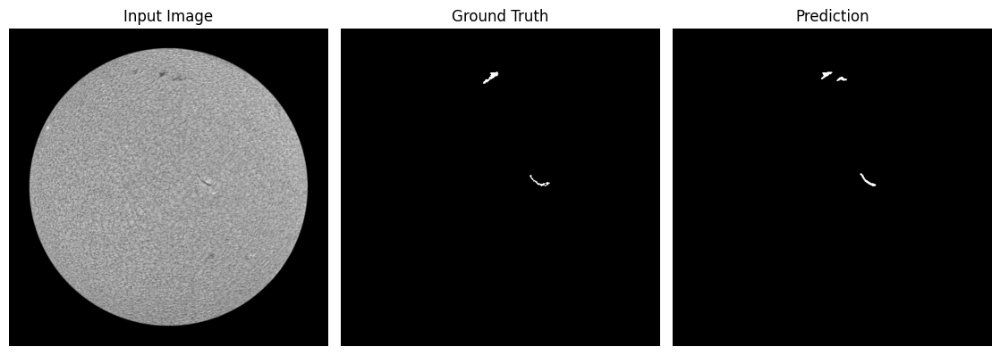

Epoch 5/50 - Train Loss: 1.0998, IoU: 0.4669 | Val Loss: 1.3167, IoU: 0.2950


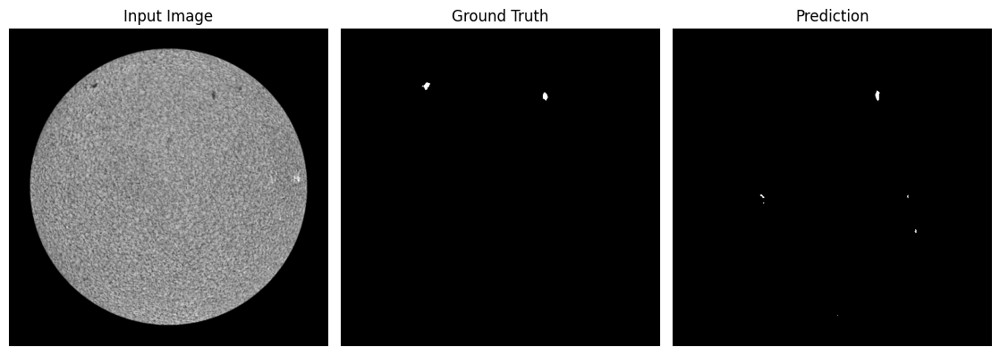

Epoch 6/50 - Train Loss: 1.0763, IoU: 0.4887 | Val Loss: 1.3925, IoU: 0.2259


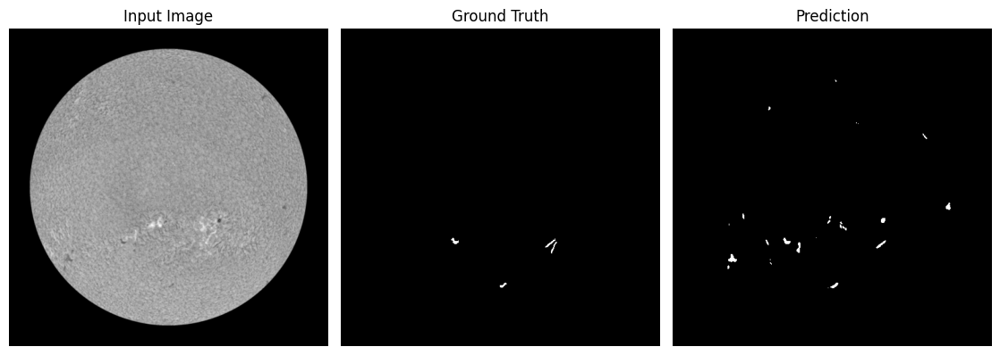

Epoch 7/50 - Train Loss: 1.0599, IoU: 0.5040 | Val Loss: 1.2761, IoU: 0.3272


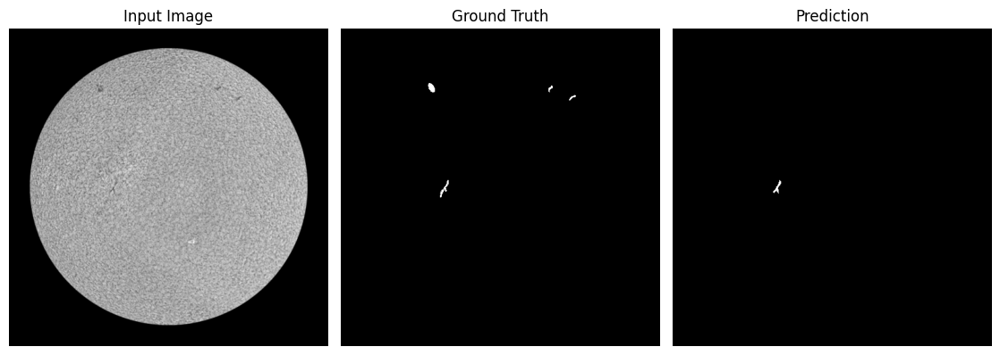

Epoch 8/50 - Train Loss: 1.0526, IoU: 0.5098 | Val Loss: 1.2622, IoU: 0.3487


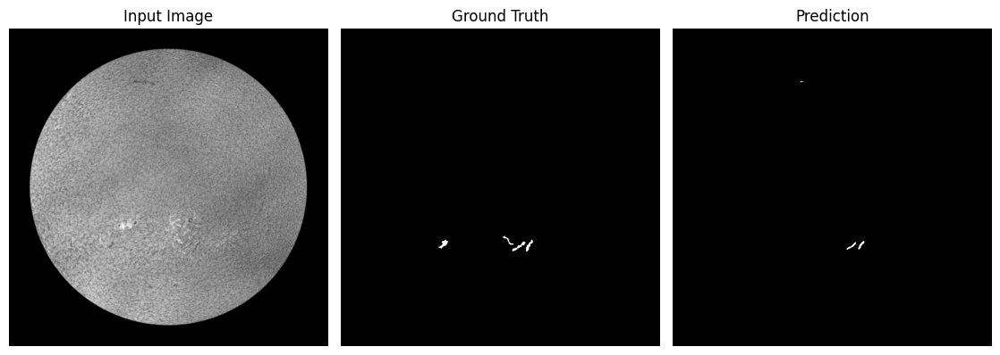

Epoch 9/50 - Train Loss: 1.0601, IoU: 0.5004 | Val Loss: 1.2562, IoU: 0.3474


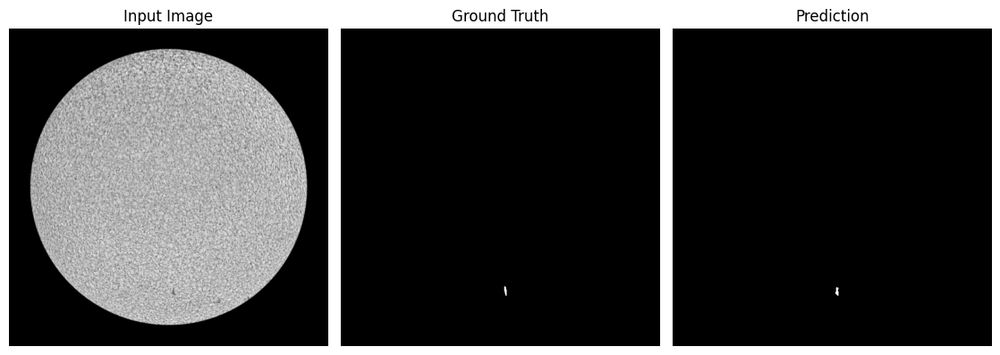

Epoch 10/50 - Train Loss: 1.0384, IoU: 0.5218 | Val Loss: 1.2651, IoU: 0.3345


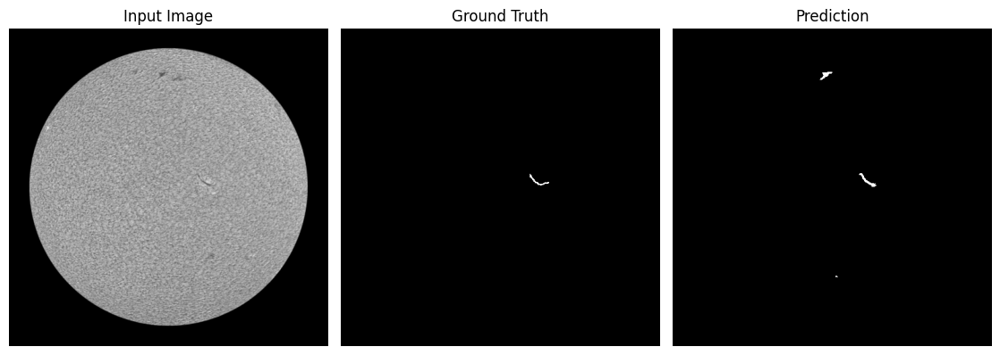

Epoch 11/50 - Train Loss: 1.0321, IoU: 0.5273 | Val Loss: 1.1885, IoU: 0.3983


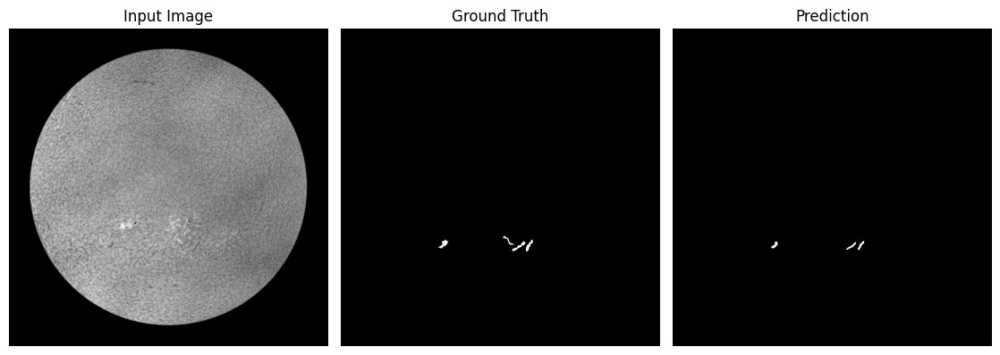

Epoch 12/50 - Train Loss: 1.0253, IoU: 0.5339 | Val Loss: 1.2219, IoU: 0.3679


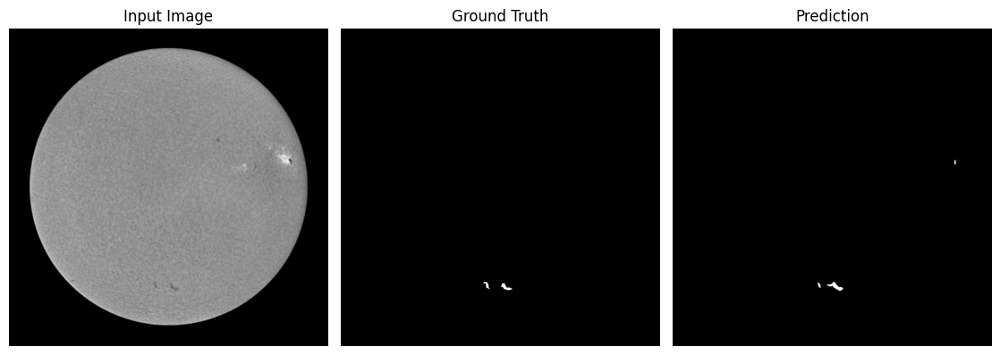

Epoch 13/50 - Train Loss: 1.0228, IoU: 0.5358 | Val Loss: 1.2819, IoU: 0.3272


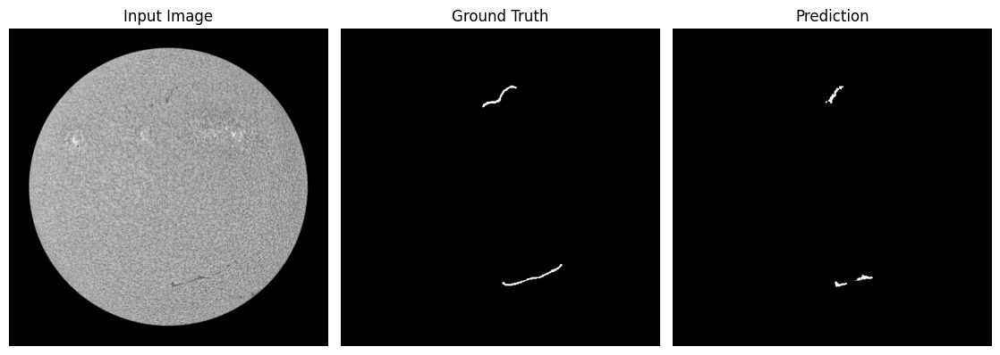

Epoch 14/50 - Train Loss: 1.0223, IoU: 0.5353 | Val Loss: 1.2342, IoU: 0.3655


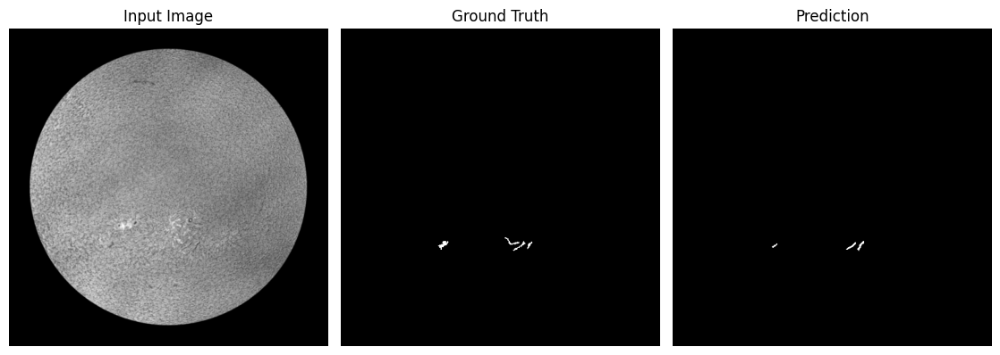

Epoch 15/50 - Train Loss: 1.0155, IoU: 0.5416 | Val Loss: 1.2325, IoU: 0.3671


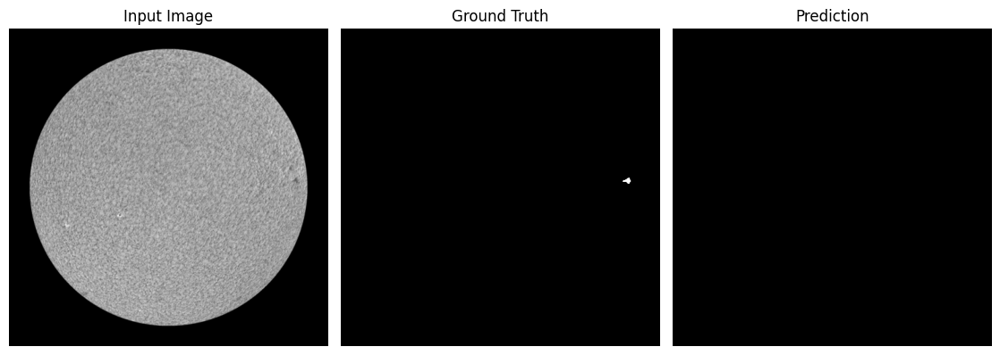

Epoch 16/50 - Train Loss: 1.0218, IoU: 0.5338 | Val Loss: 1.3479, IoU: 0.2749


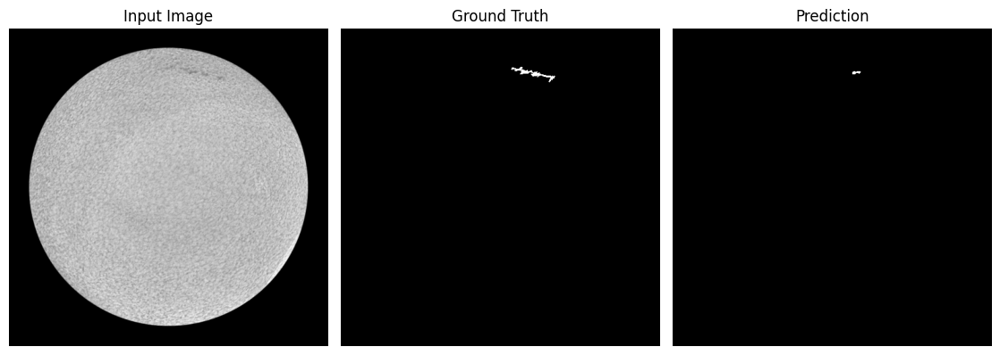

Epoch 17/50 - Train Loss: 1.0092, IoU: 0.5467 | Val Loss: 1.1813, IoU: 0.4038


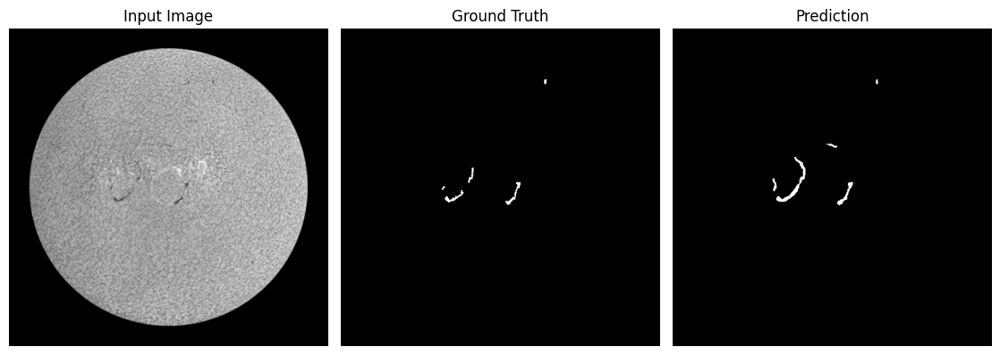

Epoch 18/50 - Train Loss: 1.0029, IoU: 0.5530 | Val Loss: 1.2360, IoU: 0.3621


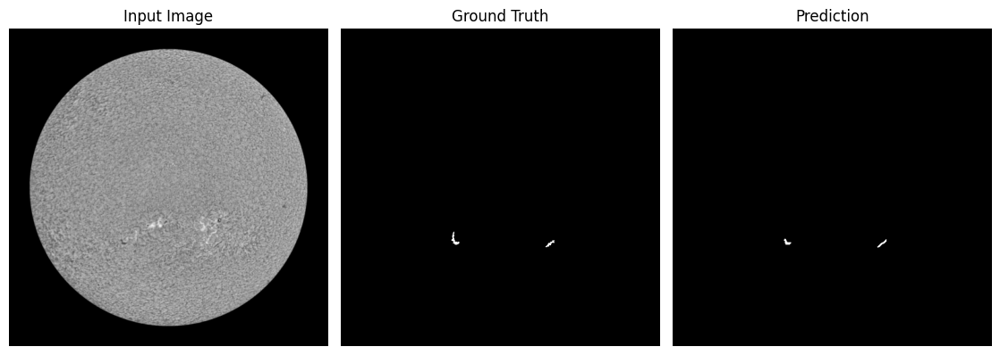

Epoch 19/50 - Train Loss: 0.9981, IoU: 0.5577 | Val Loss: 1.2405, IoU: 0.3442


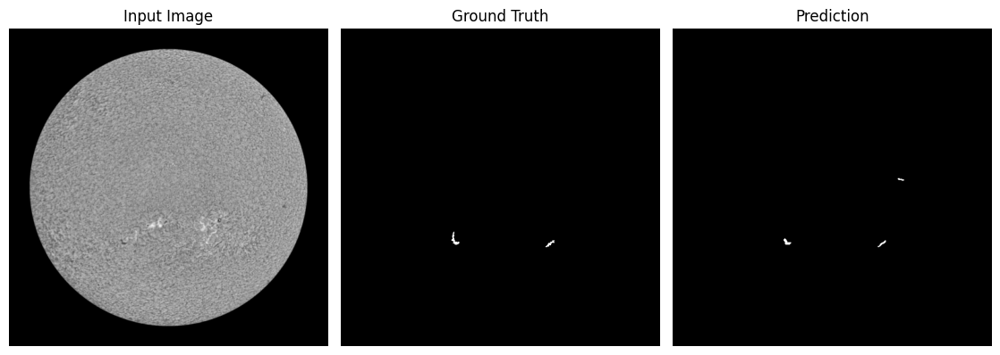

Epoch 20/50 - Train Loss: 0.9975, IoU: 0.5577 | Val Loss: 1.2386, IoU: 0.3559


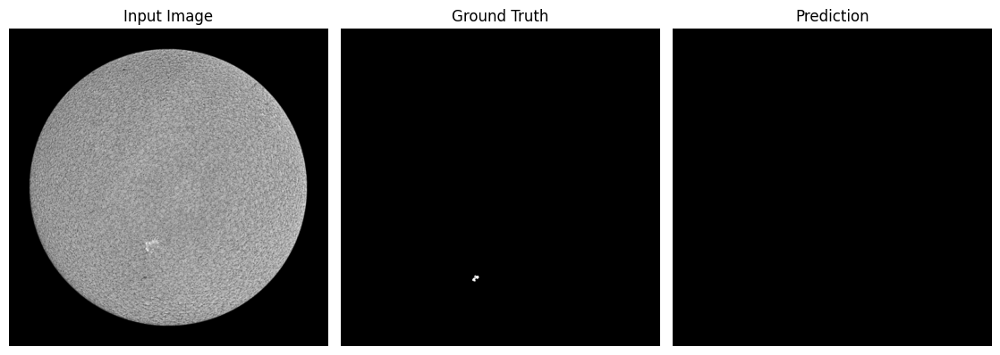

Epoch 21/50 - Train Loss: 0.9988, IoU: 0.5557 | Val Loss: 1.2454, IoU: 0.3532


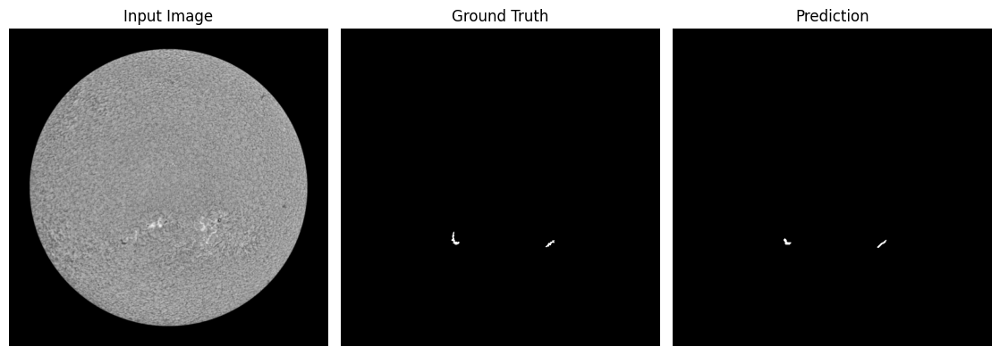

Epoch 22/50 - Train Loss: 0.9931, IoU: 0.5614 | Val Loss: 1.2966, IoU: 0.2850


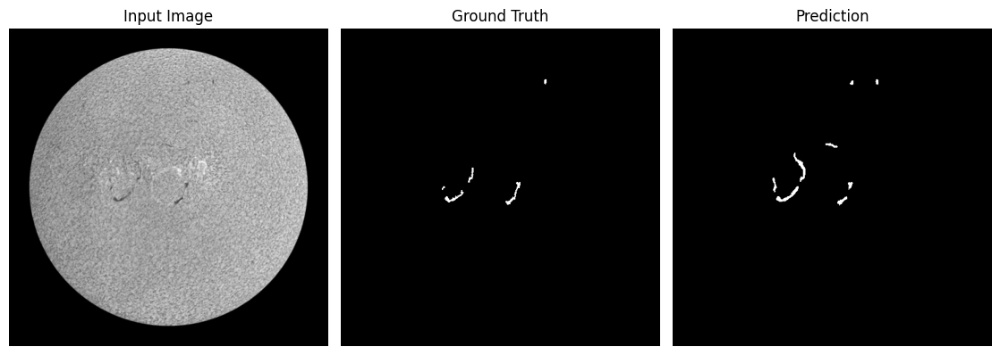

Epoch 23/50 - Train Loss: 0.9920, IoU: 0.5622 | Val Loss: 1.2324, IoU: 0.3627


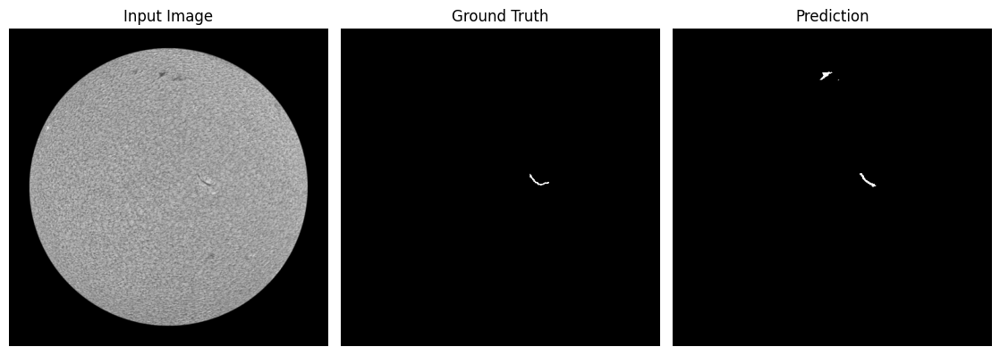

Epoch 24/50 - Train Loss: 0.9856, IoU: 0.5687 | Val Loss: 1.2204, IoU: 0.3700


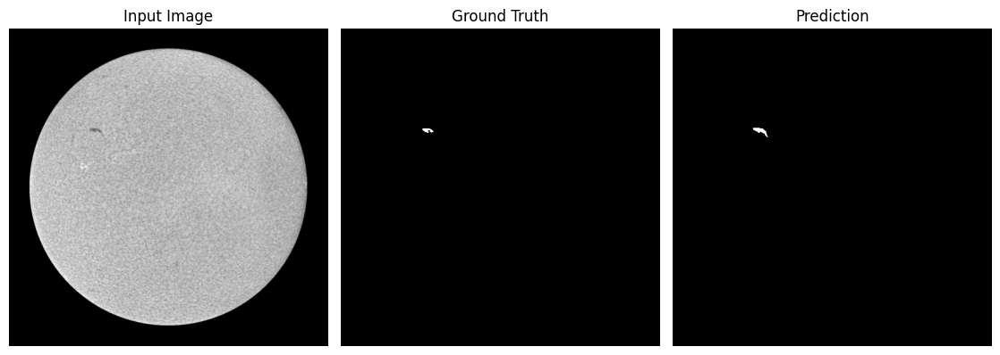

Epoch 25/50 - Train Loss: 0.9840, IoU: 0.5700 | Val Loss: 1.2049, IoU: 0.3862


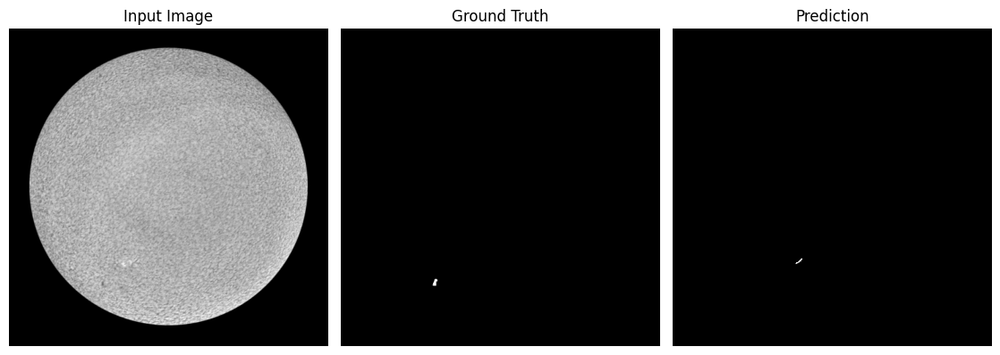

Epoch 26/50 - Train Loss: 0.9904, IoU: 0.5618 | Val Loss: 1.2300, IoU: 0.3555


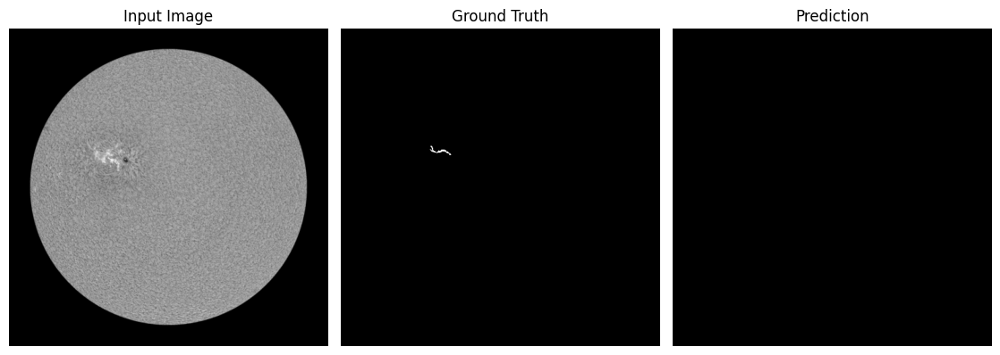

Epoch 27/50 - Train Loss: 0.9767, IoU: 0.5774 | Val Loss: 1.2274, IoU: 0.3668


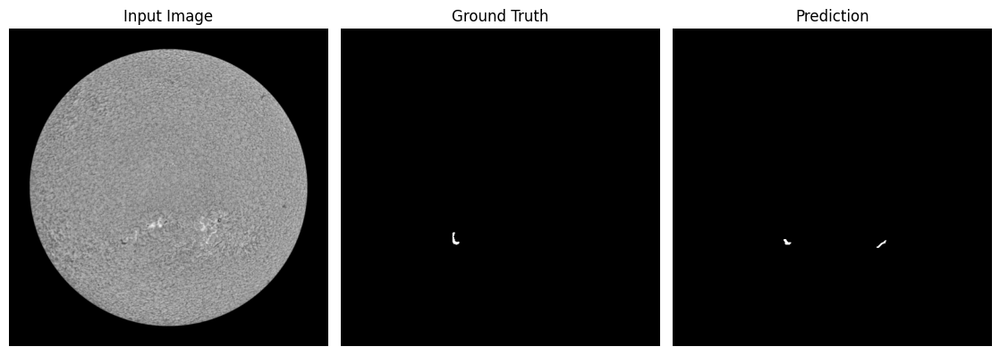

Epoch 28/50 - Train Loss: 0.9755, IoU: 0.5783 | Val Loss: 1.1800, IoU: 0.3989


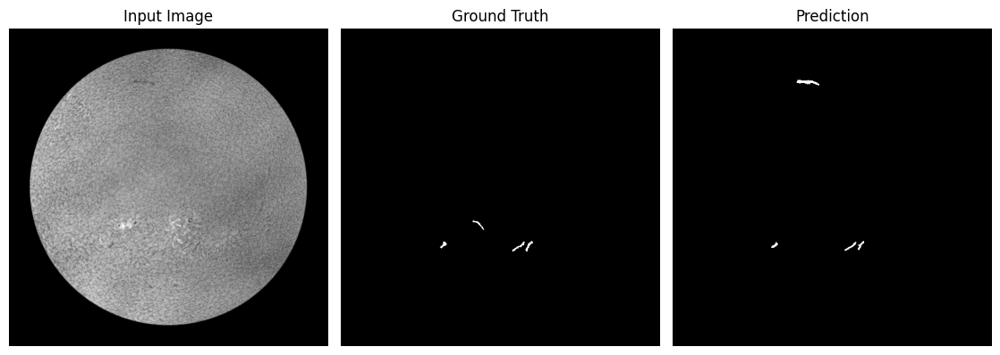

Epoch 29/50 - Train Loss: 0.9706, IoU: 0.5837 | Val Loss: 1.1821, IoU: 0.3944


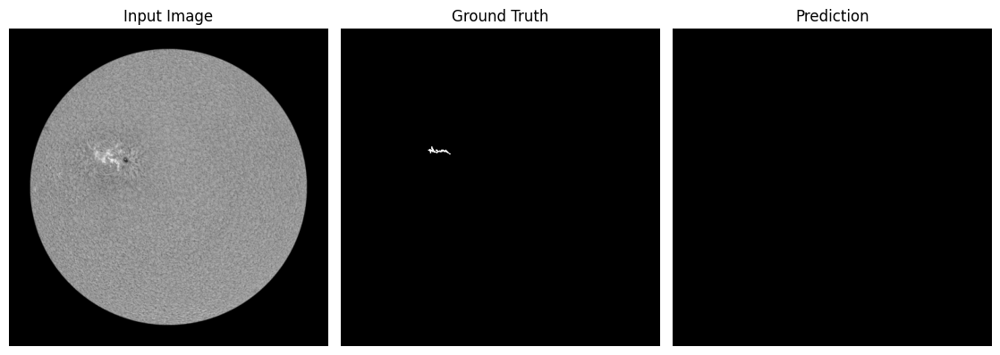

Epoch 30/50 - Train Loss: 0.9685, IoU: 0.5856 | Val Loss: 1.2310, IoU: 0.3497


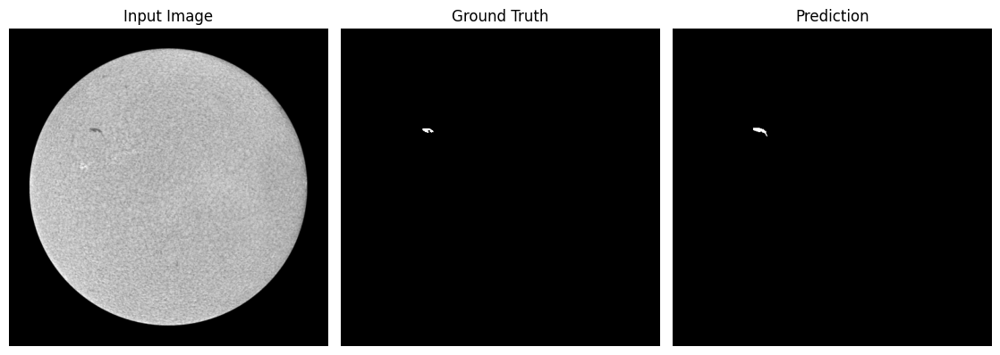

Epoch 31/50 - Train Loss: 0.9665, IoU: 0.5876 | Val Loss: 1.3031, IoU: 0.2984


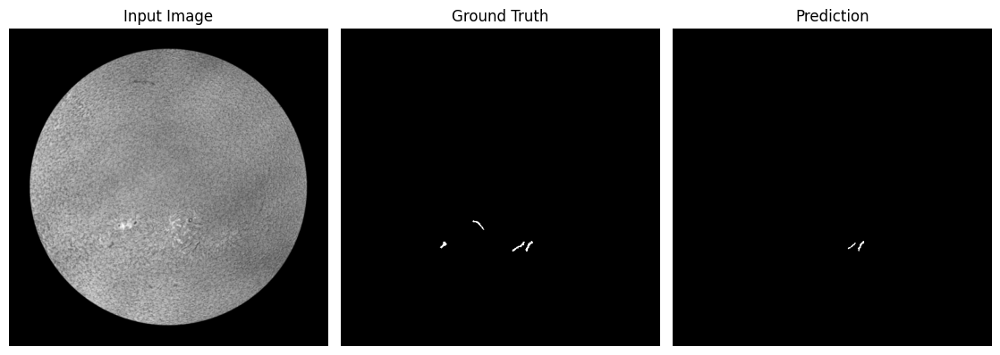

Epoch 32/50 - Train Loss: 0.9704, IoU: 0.5825 | Val Loss: 1.2182, IoU: 0.3635


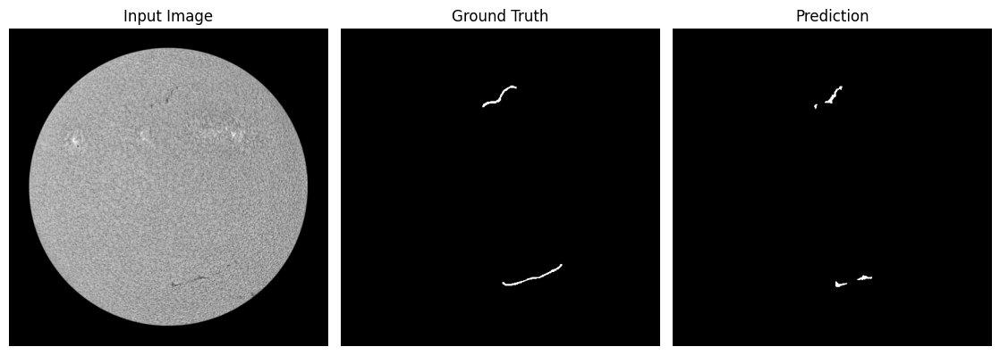

Epoch 33/50 - Train Loss: 0.9669, IoU: 0.5861 | Val Loss: 1.2763, IoU: 0.3199


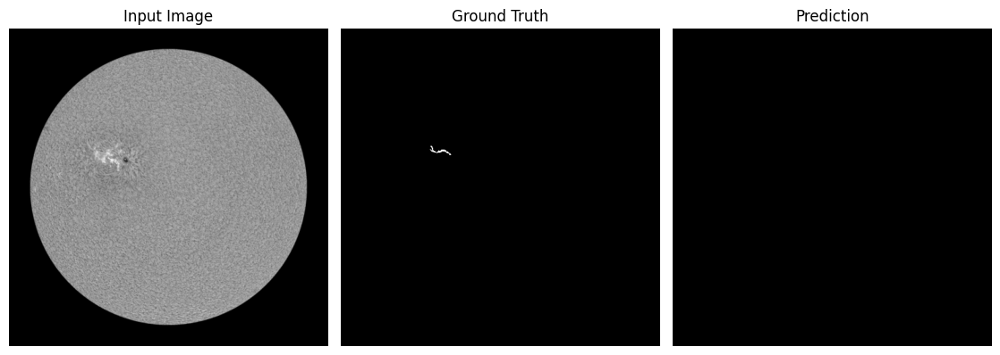

Epoch 34/50 - Train Loss: 0.9623, IoU: 0.5915 | Val Loss: 1.2606, IoU: 0.3399


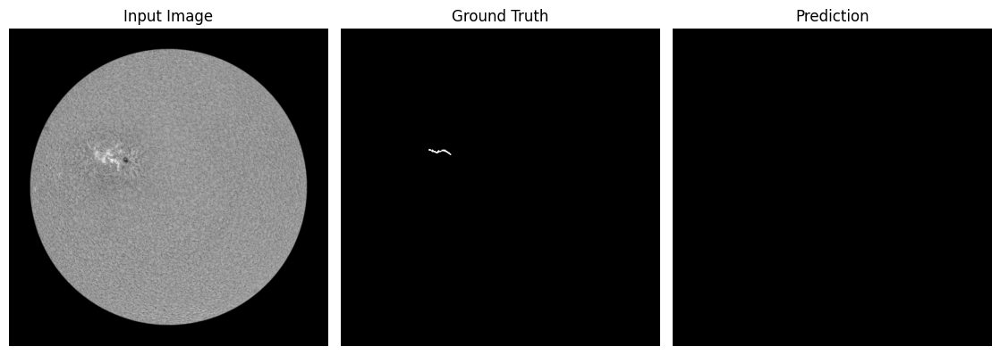

Epoch 35/50 - Train Loss: 0.9591, IoU: 0.5951 | Val Loss: 1.2731, IoU: 0.3215


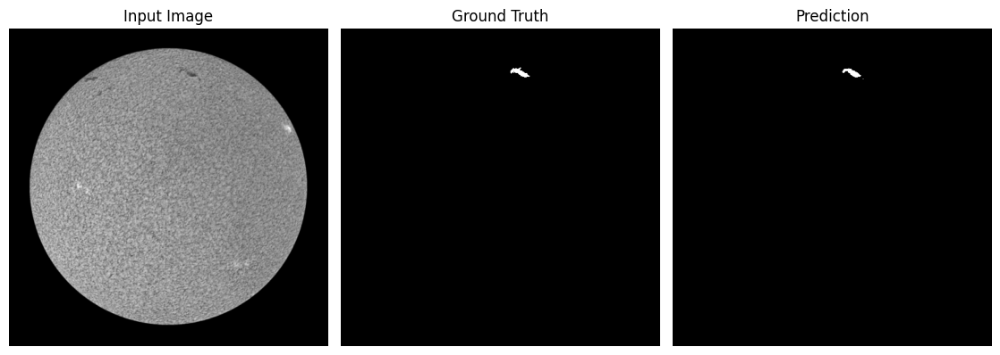

Epoch 36/50 - Train Loss: 0.9575, IoU: 0.5966 | Val Loss: 1.2364, IoU: 0.3500


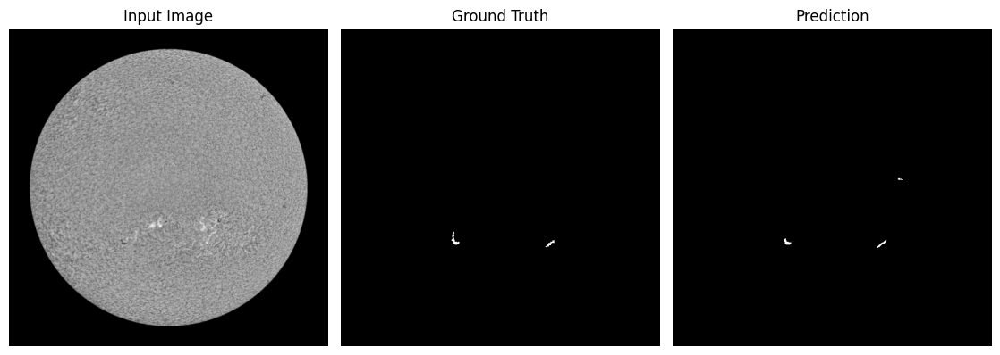

Epoch 37/50 - Train Loss: 0.9569, IoU: 0.5972 | Val Loss: 1.2314, IoU: 0.3619


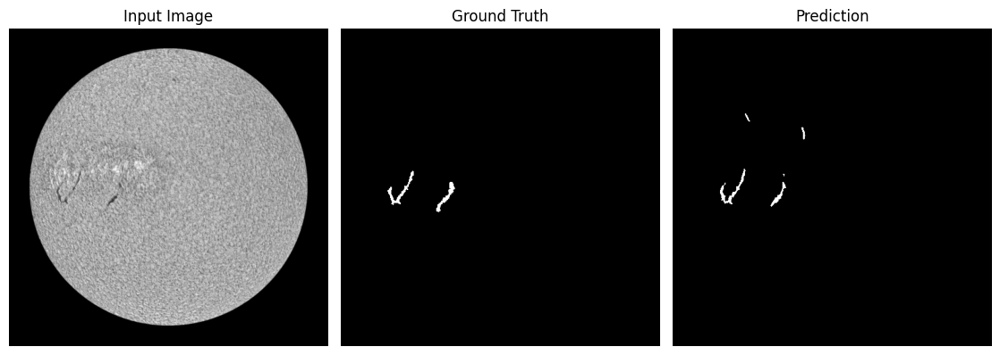

Epoch 38/50 - Train Loss: 0.9524, IoU: 0.6023 | Val Loss: 1.2233, IoU: 0.3578


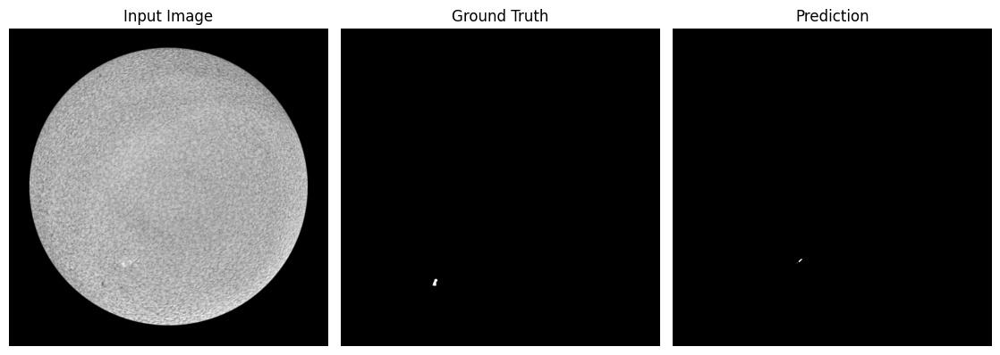

Epoch 39/50 - Train Loss: 0.9556, IoU: 0.5983 | Val Loss: 1.2761, IoU: 0.3190


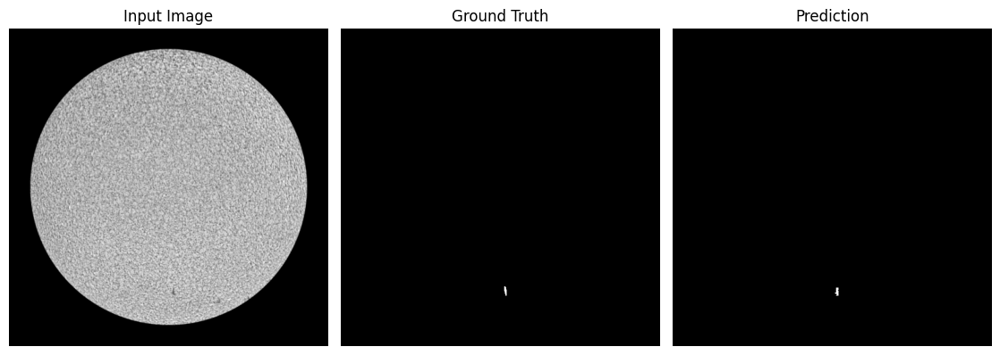

Epoch 40/50 - Train Loss: 0.9520, IoU: 0.6021 | Val Loss: 1.2297, IoU: 0.3522


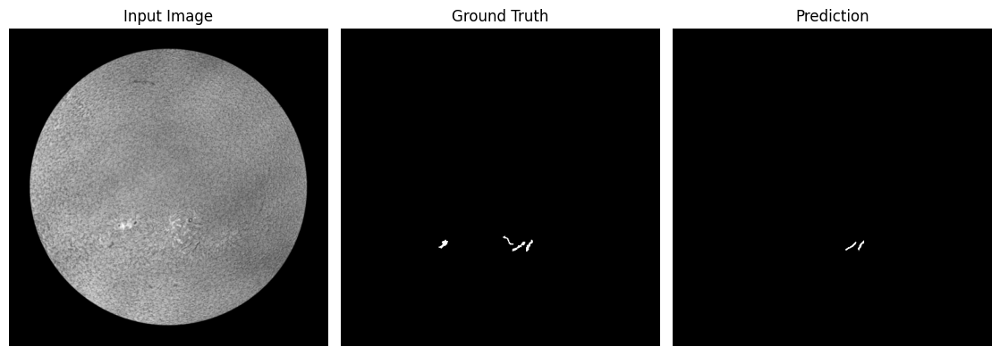

Epoch 41/50 - Train Loss: 0.9519, IoU: 0.6021 | Val Loss: 1.2128, IoU: 0.3651


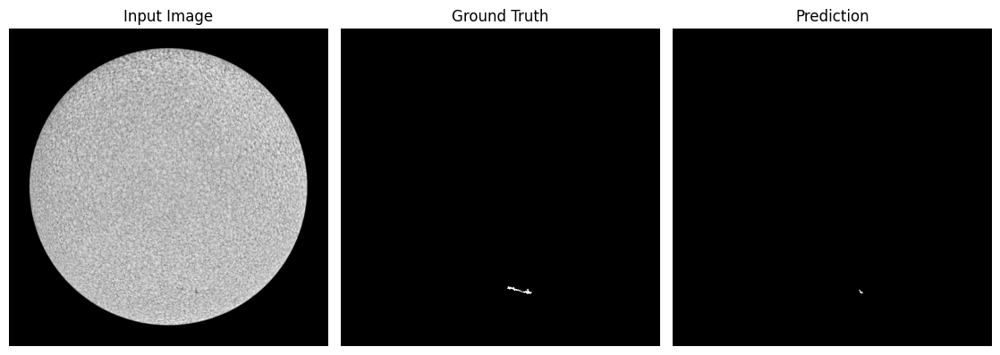

Epoch 42/50 - Train Loss: 0.9479, IoU: 0.6067 | Val Loss: 1.2279, IoU: 0.3487


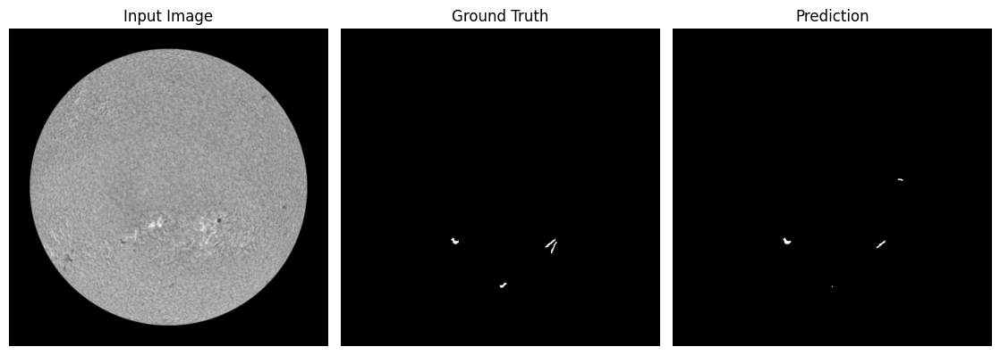

Epoch 43/50 - Train Loss: 0.9522, IoU: 0.6014 | Val Loss: 1.1748, IoU: 0.4053


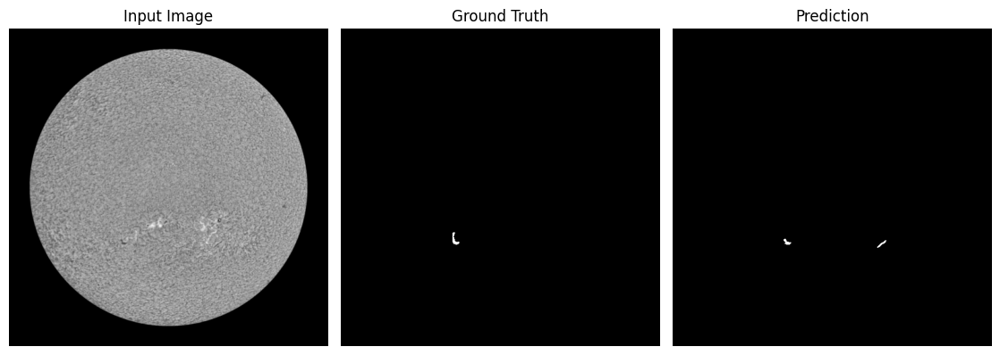

Epoch 44/50 - Train Loss: 0.9564, IoU: 0.5961 | Val Loss: 1.2182, IoU: 0.3592


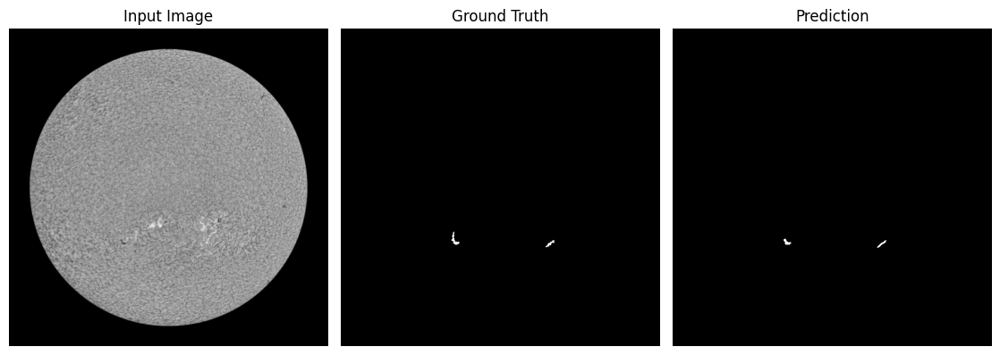

Epoch 45/50 - Train Loss: 0.9413, IoU: 0.6144 | Val Loss: 1.2248, IoU: 0.3543


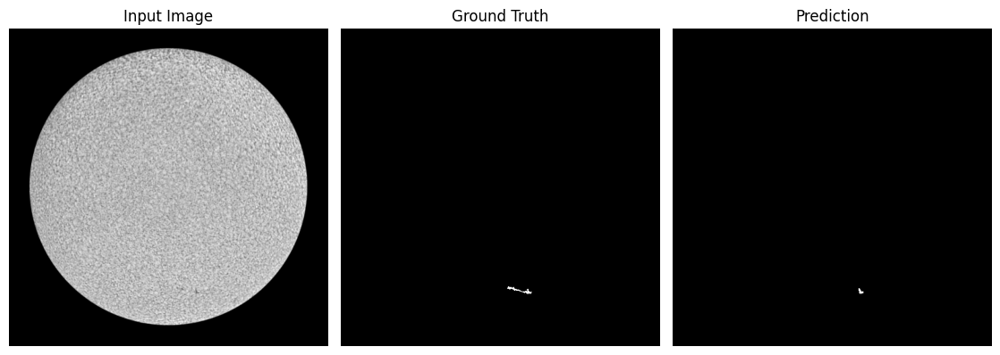

Epoch 46/50 - Train Loss: 0.9399, IoU: 0.6159 | Val Loss: 1.2301, IoU: 0.3482


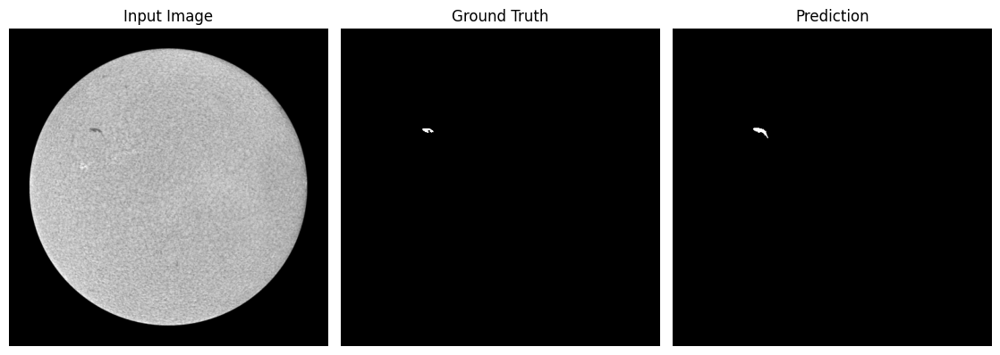

Epoch 47/50 - Train Loss: 0.9384, IoU: 0.6176 | Val Loss: 1.2143, IoU: 0.3637


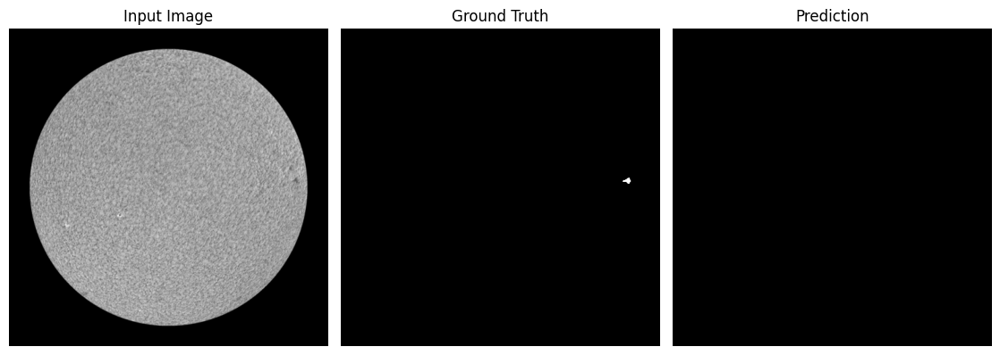

Epoch 48/50 - Train Loss: 0.9367, IoU: 0.6197 | Val Loss: 1.2271, IoU: 0.3456


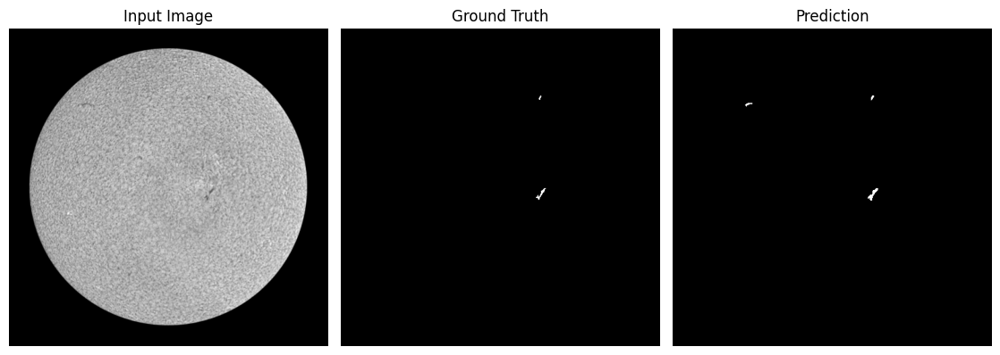

Epoch 49/50 - Train Loss: 0.9376, IoU: 0.6180 | Val Loss: 1.2269, IoU: 0.3518


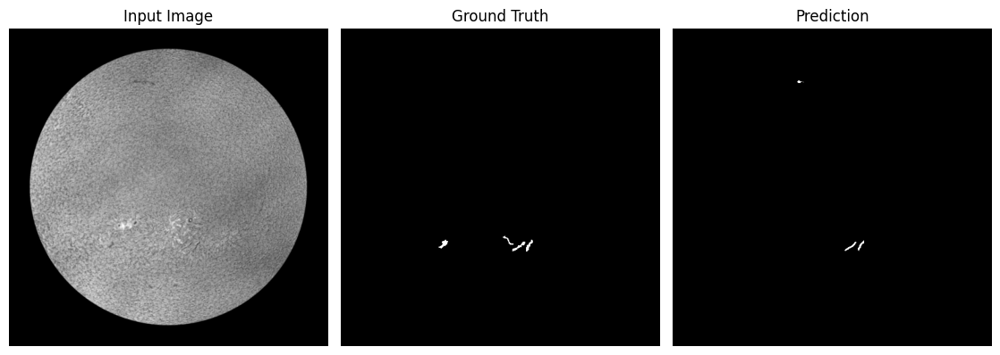

Epoch 50/50 - Train Loss: 0.9387, IoU: 0.6166 | Val Loss: 1.2452, IoU: 0.3378


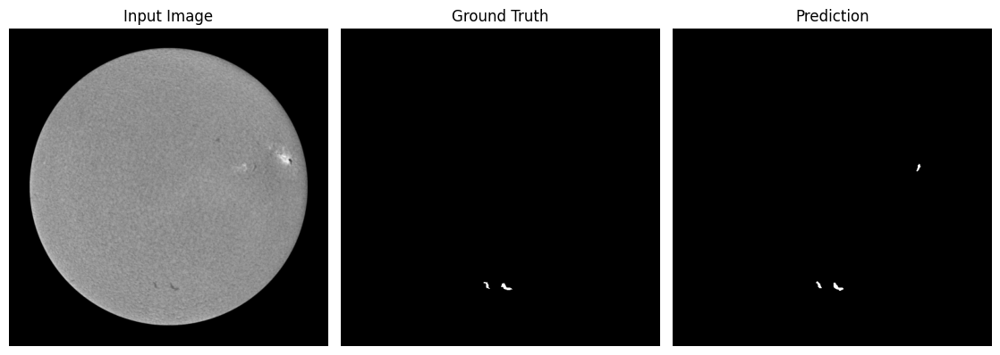

In [194]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt

class EdgeGuidedMHSA(nn.Module):
    def __init__(self, dim, heads=4, dropout=0.1):
        super().__init__()
        self.attn = nn.MultiheadAttention(embed_dim=dim, num_heads=heads, dropout=dropout, batch_first=True)
        self.norm = nn.LayerNorm(dim)
        self.dropout = nn.Dropout(dropout)
        self.edge_proj = nn.Conv2d(1, dim, kernel_size=1)

    def forward(self, x, edge):
        B, C, H, W = x.shape
        x_flat = x.view(B, C, -1).permute(0, 2, 1)  # (B, HW, C)

        edge_down = F.interpolate(edge, size=(H, W), mode='bilinear', align_corners=False)
        edge_bias = self.edge_proj(edge_down).view(B, C, -1).permute(0, 2, 1)  # (B, HW, C)

        x2, _ = self.attn(x_flat + edge_bias, x_flat + edge_bias, x_flat)
        x_flat = self.norm(x_flat + self.dropout(x2))
        x = x_flat.permute(0, 2, 1).view(B, C, H, W)
        return x

class DoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, 3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        return self.conv(x)

# Full Model
class UNetEdgeTransformer(nn.Module):
    def __init__(self, in_channels=1, out_channels=1, features=[64, 128, 256, 512]):
        super().__init__()
        self.downs = nn.ModuleList()
        self.ups = nn.ModuleList()
        self.pool = nn.MaxPool2d(2)

        # Encoder
        for feat in features:
            self.downs.append(DoubleConv(in_channels, feat))
            in_channels = feat

        # Edge map prior branch
        self.edge_prior = nn.Sequential(
            nn.Conv2d(1, 1, kernel_size=3, padding=1),
            nn.Sigmoid()
        )

        # Bottleneck
        self.bottleneck = DoubleConv(features[-1], features[-1])
        self.mhsa1 = EdgeGuidedMHSA(features[-1])
        self.mhsa2 = EdgeGuidedMHSA(features[-1])

        # Decoder
        reversed_feats = list(reversed(features))
        for i in range(len(reversed_feats)):
            up_in_ch = features[-1] if i == 0 else reversed_feats[i - 1]
            self.ups.append(nn.ConvTranspose2d(up_in_ch, reversed_feats[i], 2, 2))
            self.ups.append(DoubleConv(reversed_feats[i]*2, reversed_feats[i]))

        self.final = nn.Conv2d(features[0], out_channels, 1)

    def forward(self, x):
        skip_connections = []
        edge = self.edge_prior(x)

        for down in self.downs:
            x = down(x)
            skip_connections.append(x)
            x = self.pool(x)

        x = self.bottleneck(x)
        x = self.mhsa1(x, edge)
        x = self.mhsa2(x, edge)

        skip_connections = skip_connections[::-1]
        for i in range(0, len(self.ups), 2):
            x = self.ups[i](x)
            skip = skip_connections[i // 2]
            if x.shape != skip.shape:
                x = F.interpolate(x, size=skip.shape[2:], mode='bilinear', align_corners=False)
            x = torch.cat((skip, x), dim=1)
            x = self.ups[i + 1](x)

        seg_out = self.final(x)
        return seg_out, edge

class DiceBCELoss(nn.Module):
    def __init__(self, smooth=1.0):
        super().__init__()
        self.bce = nn.BCEWithLogitsLoss()
        self.smooth = smooth

    def forward(self, preds, targets):
        preds = torch.sigmoid(preds)
        intersection = (preds * targets).sum(dim=(1, 2, 3))
        dice = (2. * intersection + self.smooth) / (
            preds.sum(dim=(1, 2, 3)) + targets.sum(dim=(1, 2, 3)) + self.smooth)
        dice_loss = 1 - dice.mean()
        bce_loss = self.bce(preds, targets)
        return bce_loss + dice_loss

def soft_iou(pred, target, smooth=1.0):
    pred = torch.sigmoid(pred)
    intersection = (pred * target).sum(dim=(1, 2, 3))
    union = (pred + target - pred * target).sum(dim=(1, 2, 3))
    return ((intersection + smooth) / (union + smooth)).mean().item()

def edge_prior_regularizer(edge):
    return edge.abs().mean()

def boundary_alignment_loss(edge, pred_mask):
    pred_prob = torch.sigmoid(pred_mask)
    grad_x = pred_prob[:, :, :, 1:] - pred_prob[:, :, :, :-1]   # (B, C, H, W-1)
    grad_y = pred_prob[:, :, 1:, :] - pred_prob[:, :, :-1, :]   # (B, C, H-1, W)

    gx = grad_x[:, :, :-1, :]  # (B, C, H-1, W-1)
    gy = grad_y[:, :, :, :-1]  # (B, C, H-1, W-1)

    pred_edge = torch.sqrt(gx**2 + gy**2 + 1e-8)

    if pred_edge.shape != edge.shape:
        pred_edge = F.interpolate(pred_edge, size=edge.shape[2:], mode='bilinear', align_corners=False)

    loss = F.mse_loss(edge, pred_edge.detach())  # detach pred_edge to avoid gradients here
    return loss

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = UNetEdgeTransformer().to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', patience=50, factor=0.05)
loss_fn = DiceBCELoss()

lambda_edge_reg = 0.1
lambda_boundary_align = 0.1

# --- Sanity check for data loaders ---
if len(train_loader) == 0 or len(val_loader) == 0:
    raise ValueError("Train or validation loader is empty.")

train_losses, val_losses = [], []
train_ious, val_ious = [], []

epochs = 50
for epoch in range(epochs):
    model.train()
    train_loss, train_iou = 0.0, 0.0
    for img, mask, _ in train_loader:
        img, mask = img.to(device), mask.to(device)

        pred, edge = model(img)

        seg_loss = loss_fn(pred, mask)
        edge_reg_loss = edge_prior_regularizer(edge)
        boundary_loss = boundary_alignment_loss(edge, pred)

        total_loss = seg_loss + lambda_edge_reg * edge_reg_loss + lambda_boundary_align * boundary_loss

        optimizer.zero_grad()
        total_loss.backward()
        optimizer.step()

        train_loss += total_loss.item()
        train_iou += soft_iou(pred, mask)

    model.eval()
    val_loss, val_iou = 0.0, 0.0
    with torch.no_grad():
        for img, mask, _ in val_loader:
            img, mask = img.to(device), mask.to(device)
            pred, edge = model(img)

            seg_loss = loss_fn(pred, mask)
            edge_reg_loss = edge_prior_regularizer(edge)
            boundary_loss = boundary_alignment_loss(edge, pred)
            total_loss = seg_loss + lambda_edge_reg * edge_reg_loss + lambda_boundary_align * boundary_loss

            val_loss += total_loss.item()
            val_iou += soft_iou(pred, mask)

    avg_train_loss = train_loss / len(train_loader)
    avg_val_loss = val_loss / len(val_loader)
    avg_train_iou = train_iou / len(train_loader)
    avg_val_iou = val_iou / len(val_loader)

    train_losses.append(avg_train_loss)
    val_losses.append(avg_val_loss)
    train_ious.append(avg_train_iou)
    val_ious.append(avg_val_iou)

    scheduler.step(avg_val_loss)

    print(f"Epoch {epoch+1}/{epochs} - "
          f"Train Loss: {avg_train_loss:.4f}, IoU: {avg_train_iou:.4f} | "
          f"Val Loss: {avg_val_loss:.4f}, IoU: {avg_val_iou:.4f}")

    #  Visualization at every epoch 
    if epoch % 1 == 0:
        model.eval()
        with torch.no_grad():
            idx = np.random.randint(0, len(val_dataset))
            image, mask, _ = val_dataset[idx]
            image = image.unsqueeze(0).to(device)
            mask = mask.unsqueeze(0).to(device)
            pred, edge = model(image)
            pred_bin = (torch.sigmoid(pred[0]) > 0.5).float().cpu().numpy()[0]
            mask_vis = mask[0].cpu().numpy()[0]
            img_vis = image[0].cpu().numpy()[0]
            edge_vis = edge[0].cpu().numpy()[0]

            plt.figure(figsize=(15, 4))
            plt.subplot(1, 4, 1)
            plt.imshow(img_vis, cmap='gray')
            plt.title('Input Image')
            plt.axis('off')

            plt.subplot(1, 4, 2)
            plt.imshow(mask_vis, cmap='gray')
            plt.title('Ground Truth')
            plt.axis('off')

            plt.subplot(1, 4, 3)
            plt.imshow(pred_bin, cmap='gray')
            plt.title('Prediction')
            plt.axis('off')

    
            plt.tight_layout()
            plt.show()


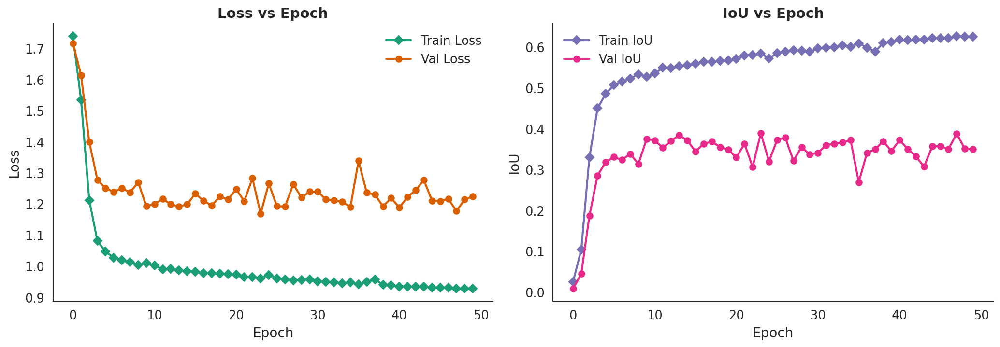

In [11]:
import matplotlib.pyplot as plt
import seaborn as sns

# Clean academic aesthetic without grid
sns.set_context("paper", font_scale=1.4)
sns.set_style("white")  # No grid background
colors = sns.color_palette("Dark2", 4)

# --- Create figure ---
fig, axes = plt.subplots(1, 2, figsize=(14, 5), dpi=150)

# --- Loss Plot (Left) ---
axes[0].plot(train_losses, label='Train Loss', marker='D', markersize=6,
             color=colors[0], linewidth=2)
axes[0].plot(val_losses, label='Val Loss', marker='o', markersize=6,
             color=colors[1], linewidth=2)
axes[0].set_title('Loss vs Epoch', fontsize=14, weight='bold')
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Loss')
axes[0].legend(frameon=False)

# --- IoU Plot (Right) ---
axes[1].plot(train_ious, label='Train IoU', marker='D', markersize=6,
             color=colors[2], linewidth=2)
axes[1].plot(val_ious, label='Val IoU', marker='o', markersize=6,
             color=colors[3], linewidth=2)
axes[1].set_title('IoU vs Epoch', fontsize=14, weight='bold')
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('IoU')
axes[1].legend(frameon=False)

# --- Final Touch ---
for ax in axes:
    ax.set_facecolor('white')  # Ensure no subtle grid lines or patches
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

plt.tight_layout()
plt.show()


   # **# Model Evaluation**

In [15]:
import numpy as np
import cv2
import time
import torch
import torch.nn.functional as F
from tqdm import tqdm
from scipy.ndimage import label as connected_components
from sklearn.metrics import precision_recall_curve, average_precision_score

# === Helper: Extract contour from binary mask ===
def extract_contour(mask_np):
    mask_uint8 = (mask_np.astype(np.uint8)) * 255
    edges = cv2.Canny(mask_uint8, threshold1=50, threshold2=150)
    contour = edges > 0
    return contour

# === Helper: Downsample mask using box count ===
def box_count_downsample(mask_np, cell_size):
    H, W = mask_np.shape
    new_H = H // cell_size
    new_W = W // cell_size
    if new_H == 0 or new_W == 0:
        return mask_np
    mask_cropped = mask_np[:new_H * cell_size, :new_W * cell_size]
    blocks = mask_cropped.reshape(new_H, cell_size, new_W, cell_size)
    blocks = blocks.max(axis=(1, 3))
    return blocks

# === Helper: Intersection ratio for two masks ===
def compute_intersection_ratio(gt_cells, pred_cells):
    intersection = np.logical_and(gt_cells, pred_cells).sum()
    gt_area = gt_cells.sum()
    if gt_area == 0:
        return 1.0
    return intersection / gt_area

# === Multi-scale IoU per object ===
def compute_miou_per_object(gt_contour, pred_contour, scales):
    miou_sum = 0.0
    for cell_size in scales:
        gt_down = box_count_downsample(gt_contour, cell_size)
        pred_down = box_count_downsample(pred_contour, cell_size)
        r = compute_intersection_ratio(gt_down, pred_down)
        miou_sum += r
    return miou_sum / len(scales)

# === Match objects (instance-level) between GT and prediction ===
def match_objects(gt_mask, pred_mask, iou_threshold=0.5):
    gt_labeled, n_gt = connected_components(gt_mask)
    pred_labeled, n_pred = connected_components(pred_mask)
    matches = []
    matched_pred = set()
    for gt_obj in range(1, n_gt + 1):
        gt_component = (gt_labeled == gt_obj)
        best_iou = 0
        best_pred_obj = None
        for pred_obj in range(1, n_pred + 1):
            if pred_obj in matched_pred:
                continue
            pred_component = (pred_labeled == pred_obj)
            intersection = np.logical_and(gt_component, pred_component).sum()
            union = np.logical_or(gt_component, pred_component).sum()
            iou = intersection / union if union > 0 else 0
            if iou > best_iou:
                best_iou = iou
                best_pred_obj = pred_obj
        if best_iou >= iou_threshold and best_pred_obj is not None:
            matches.append((gt_obj, best_pred_obj))
            matched_pred.add(best_pred_obj)
    return gt_labeled, pred_labeled, matches

# === Multi-scale IoU per image ===
def compute_multiscale_iou_per_image(gt_mask, pred_mask, scales, iou_threshold=0.5):
    gt_labeled, pred_labeled, matches = match_objects(gt_mask, pred_mask, iou_threshold=iou_threshold)
    if not matches:
        return 0.0
    miou_scores = []
    for gt_obj, pred_obj in matches:
        gt_obj_mask = (gt_labeled == gt_obj)
        pred_obj_mask = (pred_labeled == pred_obj)
        gt_contour = extract_contour(gt_obj_mask)
        pred_contour = extract_contour(pred_obj_mask)
        miou = compute_miou_per_object(gt_contour, pred_contour, scales)
        miou_scores.append(miou)
    return np.mean(miou_scores)

# === Dataset-level Multiscale IoU ===
def compute_dataset_multiscale_iou(gt_masks, pred_masks, scales=None, iou_threshold=0.5):
    if scales is None:
        scales = [32, 16, 8, 4, 2, 1]
    miou_per_image = []
    for i in tqdm(range(gt_masks.shape[0]), desc="Computing MIoU per image"):
        gt_mask = gt_masks[i, 0] > 0.5
        pred_mask = pred_masks[i, 0] > 0.5
        miou = compute_multiscale_iou_per_image(gt_mask, pred_mask, scales, iou_threshold=iou_threshold)
        miou_per_image.append(miou)
    return np.mean(miou_per_image)

# === Pairwise IoU ===
def compute_pairwise_iou(gt_mask, pred_mask, iou_threshold=0.5):
    labeled_gt, n_gt = connected_components(gt_mask)
    labeled_pred, n_pred = connected_components(pred_mask)
    ious = []
    for i in range(1, n_gt + 1):
        gt_component = (labeled_gt == i)
        if gt_component.sum() == 0:
            continue
        overlap_pred_labels = np.unique(labeled_pred[gt_component])
        overlap_pred_labels = overlap_pred_labels[overlap_pred_labels != 0]
        for j in overlap_pred_labels:
            pred_component = (labeled_pred == j)
            intersection = np.logical_and(gt_component, pred_component).sum()
            union = np.logical_or(gt_component, pred_component).sum()
            if union > 0:
                iou = intersection / union
                if iou >= iou_threshold:
                    ious.append(iou)
    return ious if ious else [0.0]

# === Dataset Pairwise Mean IoU ===
def compute_dataset_pairwise_miou(gt_masks, pred_masks, iou_threshold=0.5):
    start_time = time.time()
    all_ious = []
    for i in range(gt_masks.shape[0]):
        ious = compute_pairwise_iou(gt_masks[i, 0] > 0.5, pred_masks[i, 0] > 0.5, iou_threshold=iou_threshold)
        all_ious.extend(ious)
    result = float(np.mean(all_ious)) if all_ious else 0.0
    duration = time.time() - start_time
    print(f"Dataset Pairwise mIoU computation took: {duration:.2f}s")
    return result

# === Average Precision ===
def compute_ap(y_true, y_score):
    y_true_flat = y_true.flatten()
    y_score_flat = y_score.flatten()
    precision, recall, thresholds = precision_recall_curve(y_true_flat, y_score_flat)
    ap = average_precision_score(y_true_flat, y_score_flat)
    return ap, precision, recall, thresholds

# === Average Recall over thresholds ===
def compute_average_recall_iou_thresholds(y_true, y_pred, thresholds=np.arange(0.5, 1.0, 0.05)):
    recalls = []
    for thresh in thresholds:
        recall_sum = 0.0
        for i in range(len(y_true)):
            iou = compute_pairwise_iou(y_true[i, 0] > 0.5, y_pred[i, 0] > 0.5, iou_threshold=thresh)
            recall_sum += len(iou)
        recalls.append(recall_sum / len(y_true))
    return np.mean(recalls)

# === Collect predictions and labels ===
def collect_predictions_and_labels(model, loader, device):
    model.eval()
    y_true, y_score, preds_05, y_targets = [], [], [], []

    with torch.no_grad():
        for images, masks, _ in tqdm(loader, desc="Running inference"):
            images = images.to(device)
            masks = masks.to(device)

            preds, _ = model(images)
            probs = torch.sigmoid(preds)

            y_true.append(masks.cpu().numpy())
            y_score.append(probs.cpu().numpy())
            preds_05.append((probs > 0.5).float().cpu().numpy())
            y_targets.append(masks.cpu().numpy())

    y_true = np.concatenate(y_true, axis=0)
    y_score = np.concatenate(y_score, axis=0)
    preds_05 = np.concatenate(preds_05, axis=0)
    y_targets = np.concatenate(y_targets, axis=0)

    return y_true, y_score, preds_05, y_targets

# === Main evaluation function ===
def evaluate_model(model, test_loader, device):
    start_time = time.time()
    print("→ Collecting predictions...")
    y_true, y_score, preds_05, y_targets = collect_predictions_and_labels(model, test_loader, device)
    
    print("→ Computing Average Precision...")
    ap, precision, recall, thresholds_raw = compute_ap(y_true, y_score)

    thresholds = np.arange(0.5, 1.0, 0.05)
    print("→ Computing Average Recall (object-level)...")
    ar = compute_average_recall_iou_thresholds(y_targets, preds_05, thresholds)

    print("→ Computing Pairwise Mean IoU (old method)...")
    pairwise_miou = compute_dataset_pairwise_miou(y_targets, preds_05, iou_threshold=0.5)

    print("→ Computing Multiscale IoU (NEW paper-aligned method)...")
    ms_iou = compute_dataset_multiscale_iou(y_targets, preds_05, iou_threshold=0.5)

    duration = time.time() - start_time
    print(f"→ Evaluation done in {duration:.2f}s")
    
    return {
        "AP": ap,
        "Average Recall": ar,
        "Pairwise mIoU (old)": pairwise_miou,
        "Multiscale IoU (new)": ms_iou,
    }


In [16]:
# USAGE
results = evaluate_model(model, test_loader, device)
print(results)

→ Collecting predictions...


Running inference: 100%|██████████████████████████████████████████████████████| 50/50 [00:02<00:00, 20.96it/s]


→ Computing Average Precision...
→ Computing Average Recall (object-level)...
→ Computing Pairwise Mean IoU (old method)...
Dataset Pairwise mIoU computation took: 0.41s
→ Computing Multiscale IoU (NEW paper-aligned method)...


Computing MIoU per image: 100%|███████████████████████████████████████████████| 99/99 [00:04<00:00, 22.96it/s]

→ Evaluation done in 28.44s
{'AP': 0.5090501902596869, 'Average Recall': 1.6252525252525252, 'Pairwise mIoU (old)': 0.6451263832253951, 'Multiscale IoU (new)': 0.7032129088644158}


In [157]:
def visualize_prediction_by_filename(model, dataset, device, filename):
    model.eval()

    # Search for the image in the dataset using the filename (without extension)
    image, gt_mask, image_filename = None, None, None
    for img, mask, fname in dataset:
        if fname.split('.')[0] == filename:  # Match filename without extension
            image, gt_mask, image_filename = img, mask, fname
            break

    if image is None:
        print(f"Filename '{filename}' not found in the dataset.")
        return

    image_tensor = image.unsqueeze(0).to(device)

    with torch.no_grad():
        pred, _ = model(image_tensor)  # Unpack the tuple
        pred_mask = torch.sigmoid(pred).squeeze().cpu().numpy()

    pred_mask = (pred_mask > 0.5).astype(np.uint8)
    gt_mask = gt_mask.squeeze().cpu().numpy().astype(np.uint8)

    # Convert image tensor to numpy array
    img_np = image.squeeze().cpu().numpy()
    if img_np.ndim == 3:
        img_np_show = np.moveaxis(img_np, 0, -1)
    else:
        img_np_show = img_np

    H_img, W_img = img_np_show.shape[:2]

    # Resize masks if needed
    if gt_mask.shape != (H_img, W_img):
        gt_mask = resize(gt_mask, (H_img, W_img), order=0, preserve_range=True).astype(np.uint8)
    if pred_mask.shape != (H_img, W_img):
        pred_mask = resize(pred_mask, (H_img, W_img), order=0, preserve_range=True).astype(np.uint8)

    fig, axs = plt.subplots(1, 3, figsize=(18, 6))

    for ax in axs:
        if img_np_show.ndim == 2:
            ax.imshow(img_np_show, cmap='gray')
        else:
            ax.imshow(img_np_show)
        ax.axis('off')

    axs[0].set_title(f"Input Image: {filename}")

    # GT overlay (green)
    gt_overlay = np.zeros((H_img, W_img, 4), dtype=np.float32)
    gt_overlay[gt_mask == 1] = [0, 0.5, 0, 0.6]
    axs[1].imshow(gt_overlay)
    axs[1].set_title("Image + Ground Truth Mask")

    # Pred overlay (red)
    pred_overlay = np.zeros((H_img, W_img, 4), dtype=np.float32)
    pred_overlay[pred_mask == 1] = [1, 0, 0, 1]

    axs[2].imshow(pred_overlay)
    axs[2].set_title("Image + Predicted Mask")

    plt.tight_layout()
    plt.show()


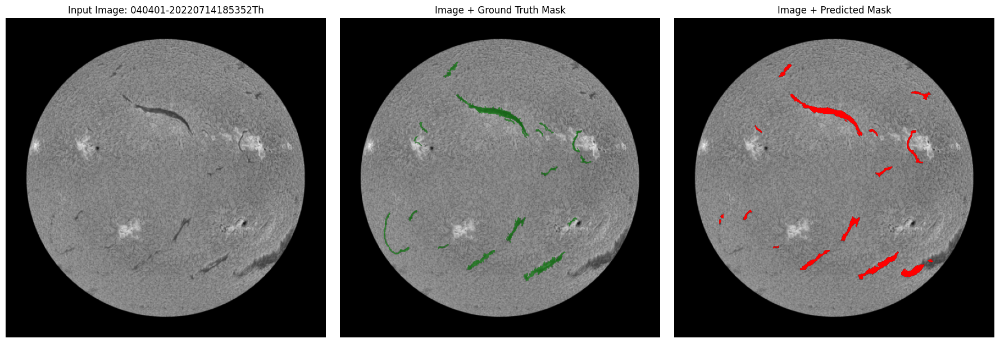

In [195]:
filename = "040401-20220714185352Th"
# filename = '040401-20220618185332Bh'
# filename = '010401-20220621185332Bh'
visualize_prediction_by_filename(model, test_dataset, device, filename)


In [216]:
%matplotlib inline


In [181]:
import os
import torch
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
from matplotlib.lines import Line2D
from matplotlib.patches import Polygon

# Updated target filenames
target_filenames = [
    "010101-20220523234912Lh", "010203-20220710085152Th",
    "010401-20210726041650Uh", "010401-20220621185332Bh",
    "010401-20220721185332Bh", "020401-20220122085210Th",
    "040201-20210620163530Mh", "040201-20220124155050Bh",
    "040401-20220618185332Bh", "040401-20220714185352Th",
    "050101-20220622205632Bh", "050201-20210730044930Lh"
]

def draw_cinched_box(ax, data, position, box_color='black', median_color='#FF7F24',
                     fill_color=None, width=0.3, pinch_frac=0.3, cinch_height_frac=0.08):
    q1, median, q3 = np.percentile(data, [25, 50, 75])
    iqr = q3 - q1
    iqr_min = q1 - 1.5 * iqr
    iqr_max = q3 + 1.5 * iqr
    filtered_data = [x for x in data if iqr_min <= x <= iqr_max]

    lower_whisker = np.min(filtered_data) if filtered_data else np.min(data)
    upper_whisker = np.max(filtered_data) if filtered_data else np.max(data)

    left = position - width / 2
    right = position + width / 2
    pinch_indent = width * pinch_frac
    cinch_height = iqr * cinch_height_frac
    top_cinch = median + cinch_height
    bottom_cinch = median - cinch_height

    verts = [
        (left, q1), (left, bottom_cinch), (left + pinch_indent, median),
        (left, top_cinch), (left, q3), (right, q3), (right, top_cinch),
        (right - pinch_indent, median), (right, bottom_cinch), (right, q1),
    ]
    polygon = Polygon(verts, closed=True, edgecolor=box_color,
                      facecolor=fill_color if fill_color else 'none', linewidth=1.5)
    ax.add_patch(polygon)

    ax.vlines(position, lower_whisker, q1, color='black', linewidth=1.2)
    ax.vlines(position, q3, upper_whisker, color='black', linewidth=1.2)

    cap_width = width * 0.25
    ax.hlines(lower_whisker, position - cap_width / 2, position + cap_width / 2, color='black', linewidth=1.2)
    ax.hlines(upper_whisker, position - cap_width / 2, position + cap_width / 2, color='black', linewidth=1.2)

    ax.hlines(median, left + pinch_indent, right - pinch_indent, color=median_color, linewidth=2)

    outliers = [x for x in data if x < iqr_min or x > iqr_max]
    if outliers:
        ax.plot([position] * len(outliers), outliers, 'o', markerfacecolor='none',
                markeredgecolor='black', markersize=6)

def generate_all_boxplots_in_row(model, dataloader, device,
                                 max_images=30,
                                 save_name="boxplots_edgeattnet.pdf"):
    model.eval()
    spacing = 0.8
    group_width = 0.25
    inner_gap = 0.1  # updated from 0.08 to 0.1
    post_separator_gap = 0.15
    fig_width = max_images * (spacing + post_separator_gap)
    fig, ax = plt.subplots(figsize=(fig_width, 4.0), dpi=600)  # height 3.0 instead of 5.0

    image_counter = 0
    scales = [32, 16, 8, 4, 2, 1]
    separator_gap = 0.2
    separator_lines = []

    filenames_for_xaxis = []  # List to hold the filenames to display on the x-axis

    with torch.no_grad():
        for images, masks, filenames in tqdm(dataloader, desc="Generating Cinched Waist Boxplots"):
            images, masks = images.to(device), masks.to(device)
            outputs = model(images)
            probs = torch.sigmoid(outputs[0]).cpu().numpy()  # keep this as-is per your request
            preds = (probs > 0.5).astype(float)

            for i in range(images.size(0)):
                filename = filenames[i]

                if filename not in target_filenames:
                    continue

                if image_counter >= max_images:
                    break

                gt = masks[i, 0].cpu().numpy() > 0.5
                pred = preds[i, 0]
                pairwise_ious = compute_pairwise_iou(gt, pred)

                if isinstance(pairwise_ious, (int, float)):
                    pairwise_ious = [pairwise_ious]
                if len(pairwise_ious) == 0:
                    print(f"Skipping {filename} due to insufficient pairwise IoU values")
                    pairwise_ious = []

                gt_labeled, pred_labeled, matches = match_objects(gt, pred, iou_threshold=0.5)
                multiscale_ious = []
                for gt_obj, pred_obj in matches:
                    gt_obj_mask = (gt_labeled == gt_obj)
                    pred_obj_mask = (pred_labeled == pred_obj)
                    gt_contour = extract_contour(gt_obj_mask)
                    pred_contour = extract_contour(pred_obj_mask)
                    miou = compute_miou_per_object(gt_contour, pred_contour, scales)
                    multiscale_ious.append(miou)

                if len(multiscale_ious) == 0:
                    multiscale_ious = []

                group_center = (image_counter + 1) * spacing + image_counter * post_separator_gap

                pairwise_pos = group_center - group_width / 2 - inner_gap / 2
                ms_pos = group_center + group_width / 2 + inner_gap / 2

                if pairwise_ious:
                    draw_cinched_box(ax, pairwise_ious, position=pairwise_pos,
                                     box_color='#8A2BE2', median_color='#FF7F24',
                                     fill_color=None, width=0.3, pinch_frac=0.3)
                    ax.plot(pairwise_pos, np.mean(pairwise_ious), marker='^', color='#5ab4ac', markersize=8, linestyle='None')
                else:
                    ax.text(pairwise_pos, 0.5, 'Insufficient IoU', ha='center', va='center', color='red', fontsize=8)

                if multiscale_ious:
                    draw_cinched_box(ax, multiscale_ious, position=ms_pos,
                                     box_color='black', median_color='#FF7F24',
                                     fill_color='#CD5B45', width=0.3, pinch_frac=0.3)
                    ax.plot(ms_pos, np.mean(multiscale_ious), marker='^', color='#5ab4ac', markersize=8, linestyle='None')
                else:
                    ax.text(ms_pos, 0.5, 'Insufficient IoU', ha='center', va='center', color='red', fontsize=8)

                separator_lines.append(ms_pos + group_width / 2 + separator_gap)
                filenames_for_xaxis.append(filename)

                image_counter += 1

            if image_counter >= max_images:
                break

    if separator_lines:
        separator_lines = separator_lines[:-1]

    for x in separator_lines:
        ax.axvline(x, color='gray', linestyle='--', linewidth=2.0, alpha=0.7)

    ax.set_xlim(spacing * 0.5, (image_counter + 1) * spacing + (image_counter - 1) * post_separator_gap)
    ax.set_ylim(0.35, 1.05)
    ax.set_ylabel('IoU', fontsize=15)
    ax.set_xlabel('H-alpha Observation Timestamp', fontsize=14)

    ax.grid(True, which='major', axis='y', linestyle='--', linewidth=0.5, color='gray', alpha=0.6)

    # Set xticks to be at group centers
    xtick_positions = []
    for idx in range(image_counter):
        group_center = (idx + 1) * spacing + idx * post_separator_gap
        xtick_positions.append(group_center)

    ax.set_xticks(xtick_positions)
    ax.set_xticklabels(filenames_for_xaxis, rotation=83, ha='right', fontsize=8)
    ax.tick_params(axis='y', direction='out', length=6, width=1.5, labelsize=10)


    plt.tight_layout()
    plt.subplots_adjust(bottom=0.25)

    plt.savefig(save_name, bbox_inches='tight', format='pdf')
    plt.show()

Generating Cinched Waist Boxplots:  92%|██████████████████████████████████▉   | 46/50 [00:03<00:00, 13.95it/s]


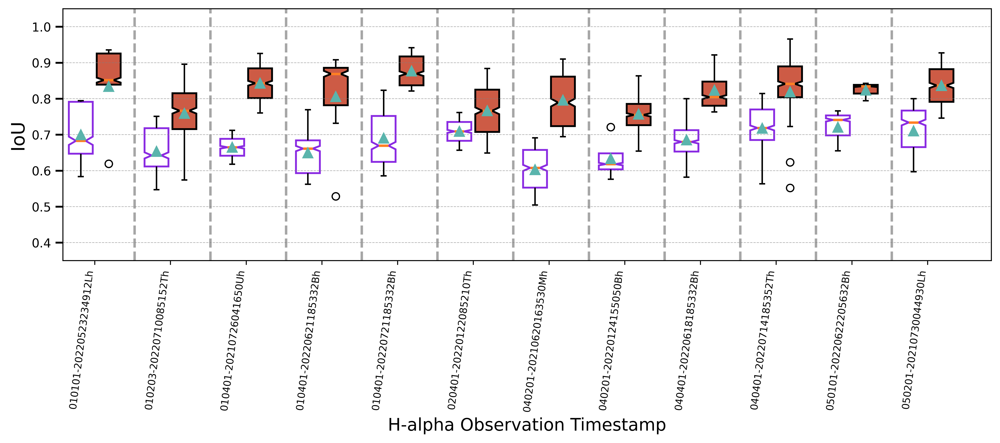

In [182]:
generate_all_boxplots_in_row(
    model=model,
    dataloader=test_loader,
    device=device,
    max_images=12,
    save_name=""
)


In [250]:
model

UNetEdgeTransformer(
  (downs): ModuleList(
    (0): DoubleConv(
      (conv): Sequential(
        (0): Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
        (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (5): ReLU(inplace=True)
      )
    )
    (1): DoubleConv(
      (conv): Sequential(
        (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
        (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (5): ReLU(inplace=True)
      )
    )
    (2): Doubl

In [183]:
total_params = sum(p.numel() for p in model.parameters())
print(f"Total number of parameters: {total_params}")

Total number of parameters: 22658891
